In [1]:
%config Completer.use_jedi = False 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Exploratory Data Analysis

## 1 - Data undertanding and drop of unasable columns

We re going to have a first look on understanding of the differrent varables and to clean / drop the columns that are not usable / going to produce noise in further analysis

In [2]:
pd.set_option('display.max_columns', None)
df = pd.read_csv('Data/windProject.csv')
df

,forecast dt unixtime,forecast dt iso,slice dt unixtime,slice dt iso,lat,lon,temperature,dew_point,pressure,ground_pressure,humidity,clouds,wind_speed,wind_deg,rain,snow,ice,fr_rain,convective,snow_depth,accumulated,hours,rate,Direction N-S,Direction E-W,Compass,DateTime,Tarifa_WindGust,Tarifa_Wind,Tarifa_WindDirection,Tarifa_Direction N-S,Tarifa_Direction E-W,Tarifa Compass
0,1550275200,2019-02-16,1550307600,2019-02-16 09:00:00,36.013158,-5.598892,13.79,11.13,1021.601,1020.681,83.994,100.0,25.963871,95.202,0.125,0.0,0.0,0.0,0.125,999900026055400900000,0.125,3.0,0.0,-0.090667,0.995881,E,2019-02-16 09:00:00,35.118709,17.624149,72.0,0.309017,0.951057,NEE
1,1550275200,2019-02-16,1550318400,2019-02-16 12:00:00,36.013158,-5.598892,13.81,11.16,1022.066,1021.490,84.064,96.0,25.437090,93.856,0.375,0.0,0.0,0.0,0.375,999900026055400900000,0.375,6.0,0.0,-0.067249,0.997736,E,2019-02-16 12:00:00,35.053915,21.835803,86.0,0.069756,0.997564,E
2,1550275200,2019-02-16,1550329200,2019-02-16 15:00:00,36.013158,-5.598892,13.82,11.15,1020.887,1020.461,83.926,92.0,23.938390,93.883,0.188,0.0,0.0,0.0,0.188,999900026055400900000,0.188,3.0,0.0,-0.067719,0.997704,E,2019-02-16 15:00:00,34.859531,20.539909,82.0,0.139173,0.990268,E
3,1550275200,2019-02-16,1550340000,2019-02-16 18:00:00,36.013158,-5.598892,13.77,11.27,1020.964,1020.196,84.583,94.0,19.924360,95.812,0.312,0.0,0.0,0.0,0.312,999900026055400900000,0.312,6.0,0.0,-0.101265,0.994860,E,2019-02-16 18:00:00,35.766656,23.326080,87.0,0.052336,0.998630,E
4,1550275200,2019-02-16,1550350800,2019-02-16 21:00:00,36.013158,-5.598892,13.74,11.24,1022.636,1021.323,84.845,88.0,16.271885,94.213,0.000,0.0,0.0,0.0,0.000,999900026055400900000,0.000,3.0,0.0,-0.073464,0.997298,E,2019-02-16 21:00:00,NaN,NaN,83.0,0.121869,0.992546,E
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6341,1621382400,2021-05-19,1621414800,2021-05-19 09:00:00,36.013158,-5.598892,23.05,12.91,1018.467,1006.124,52.600,41.9,1.315980,231.962,0.000,0.0,0.0,0.0,0.000,0,0.000,3.0,0.0,-0.616184,-0.787602,SW,2021-05-19 09:00:00,6.933029,3.239733,249.0,-0.358368,-0.933580,SWW
6342,1621382400,2021-05-19,1621425600,2021-05-19 12:00:00,36.013158,-5.598892,24.45,11.55,1018.233,1005.913,44.200,28.7,4.089839,78.455,0.000,0.0,0.0,0.0,0.000,0,0.000,6.0,0.0,0.200138,0.979768,NEE,2021-05-19 12:00:00,20.215936,12.829344,102.0,-0.207912,0.978148,SEE
6343,1621382400,2021-05-19,1621436400,2021-05-19 15:00:00,36.013158,-5.598892,22.65,12.45,1018.215,1005.855,52.500,25.3,11.151810,68.753,0.000,0.0,0.0,0.0,0.000,0,0.000,3.0,0.0,0.362389,0.932027,NEE,2021-05-19 15:00:00,28.768832,17.948123,74.0,0.275637,0.961262,NEE
6344,1621382400,2021-05-19,1621447200,2021-05-19 18:00:00,36.013158,-5.598892,19.66,16.55,1018.845,1006.444,82.600,21.5,11.254834,61.292,0.000,0.0,0.0,0.0,0.000,0,0.000,6.0,0.0,0.480346,0.877079,NEE,2021-05-19 18:00:00,27.861707,17.818533,72.0,0.309017,0.951057,NEE


Descrption of features:

- main
 - main.pressure Atmospheric pressure (on the sea level), hPa
 - main.grnd_pressure Atmospheric pressure (on the surface), hPa
 - main.temp Temperature
 - main.dew_point Temperature of the dew point
 - main.humidity Humidity, %
-precipitation
 - precipitation.snow_depth Depth of snow, cm
 - precipitation.snow Snow water equivalent, mm
 - precipitation.rain Rain, mm
 - precipitation.hours Number of hours for which precipitation values are calculated
 - precipitation.rate Intensity, mm/s
 - precipitation.fr_rain Freezing rain, mm
 - precipitation.ice Ice pellets, mm
-wind
 - wind.speed Wind speed
 - wind.deg Wind direction, degrees (meteorological)
-clouds
 - clouds.all Cloudiness, %
 
- dt Date for which the forecast is made, unix, UTC

In [3]:
df.columns

Index(['forecast dt unixtime', 'forecast dt iso', 'slice dt unixtime',
       'slice dt iso', 'lat', 'lon', 'temperature', 'dew_point', 'pressure',
       'ground_pressure', 'humidity', 'clouds', 'wind_speed', 'wind_deg',
       'rain', 'snow', 'ice', 'fr_rain', 'convective', 'snow_depth',
       'accumulated', 'hours', 'rate', 'Direction N-S', 'Direction E-W',
       'Compass', 'DateTime', 'Tarifa_WindGust', 'Tarifa_Wind',
       'Tarifa_WindDirection', 'Tarifa_Direction N-S', 'Tarifa_Direction E-W',
       'Tarifa Compass'],
      dtype='object')

In [4]:
features = ['temperature', 'dew_point', 'pressure',
       'ground_pressure', 'humidity', 'clouds', 'wind_speed', 'wind_deg',
       'rain', 'snow', 'ice', 'fr_rain', 'convective', 'snow_depth',
       'accumulated', 'hours', 'rate','Compass']
targets = ['Tarifa_WindGust', 'Tarifa_Wind','Tarifa Compass'] 
# For the visualization we will use the compass. For the ML/F Eng wind direction N/S E/W will be used. 

In [5]:
df[features].corr()

,temperature,dew_point,pressure,ground_pressure,humidity,clouds,wind_speed,wind_deg,rain,snow,ice,fr_rain,convective,accumulated,hours,rate
temperature,1.000000,0.815398,-0.333442,-0.316762,-0.266256,-0.208218,0.011852,-0.156536,-0.137409,NaN,NaN,NaN,-0.131792,-0.145424,0.025188,-0.047952
dew_point,0.815398,1.000000,-0.323006,-0.295276,0.336644,-0.028811,0.104432,-0.297980,-0.056016,NaN,NaN,NaN,-0.056855,-0.063249,-0.006748,-0.012710
pressure,-0.333442,-0.323006,1.000000,0.793675,0.002387,-0.067360,-0.061401,-0.073926,-0.221961,NaN,NaN,NaN,-0.224700,-0.232001,-0.014917,-0.108551
ground_pressure,-0.316762,-0.295276,0.793675,1.000000,0.017251,-0.150087,0.037137,-0.113974,-0.220076,NaN,NaN,NaN,-0.261332,-0.228353,-0.010052,-0.102413
humidity,-0.266256,0.336644,0.002387,0.017251,1.000000,0.304492,0.147175,-0.238506,0.143142,NaN,NaN,NaN,0.124964,0.146045,-0.052349,0.065221
clouds,-0.208218,-0.028811,-0.067360,-0.150087,0.304492,1.000000,0.168482,-0.106444,0.240666,NaN,NaN,NaN,0.219665,0.242737,0.005923,0.089334
wind_speed,0.011852,0.104432,-0.061401,0.037137,0.147175,0.168482,1.000000,-0.159149,0.111101,NaN,NaN,NaN,0.110534,0.099871,0.010175,0.036672
wind_deg,-0.156536,-0.297980,-0.073926,-0.113974,-0.238506,-0.106444,-0.159149,1.000000,0.026979,NaN,NaN,NaN,0.070328,0.033482,-0.004225,-0.000719
rain,-0.137409,-0.056016,-0.221961,-0.220076,0.143142,0.240666,0.111101,0.026979,1.000000,NaN,NaN,NaN,0.465169,0.999284,0.078265,0.634625
snow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
print(df['ice'].sum())
print(df['snow'].sum())
print(df['fr_rain'].sum())
print(df['rate'].sum())

0.0
0.0
0.0
0.026


In [7]:
# This columns are either empty/not relevant for our project 
df.drop(columns=['ice','snow','fr_rain', 'rate'], inplace=True)

In [8]:
df.dtypes

forecast dt unixtime      int64
forecast dt iso          object
slice dt unixtime         int64
slice dt iso             object
lat                     float64
lon                     float64
temperature             float64
dew_point               float64
pressure                float64
ground_pressure         float64
humidity                float64
clouds                  float64
wind_speed              float64
wind_deg                float64
rain                    float64
convective              float64
snow_depth               object
accumulated             float64
hours                   float64
Direction N-S           float64
Direction E-W           float64
Compass                  object
DateTime                 object
Tarifa_WindGust         float64
Tarifa_Wind             float64
Tarifa_WindDirection    float64
Tarifa_Direction N-S    float64
Tarifa_Direction E-W    float64
Tarifa Compass           object
dtype: object

In [9]:
df['slice dt iso'].equals(df['DateTime'])

True

- We used this two dates to merge the dataframe so we can drop one of them, 'DateTime' 
- Additionally we are going to drop also 
 - *forecast dt unixtime* *(remember from Data Cleaning that we used the 00.00 UTM time forecast for each 24 hours forcast, we dont need this information for the next steps)*
 -  forecast dt iso *(redundant with forecast dt unixtime)*
 - slice dt unixtime *(redundant with slice dt iso)
 - snow_depth 'The values given are erratic and in any case does are not relevant for this project'

In [10]:
df.drop(columns=['forecast dt unixtime', 'forecast dt iso' ,'slice dt unixtime','DateTime', 'snow_depth'], inplace=True)

In [11]:
df

,slice dt iso,lat,lon,temperature,dew_point,pressure,ground_pressure,humidity,clouds,wind_speed,wind_deg,rain,convective,accumulated,hours,Direction N-S,Direction E-W,Compass,Tarifa_WindGust,Tarifa_Wind,Tarifa_WindDirection,Tarifa_Direction N-S,Tarifa_Direction E-W,Tarifa Compass
0,2019-02-16 09:00:00,36.013158,-5.598892,13.79,11.13,1021.601,1020.681,83.994,100.0,25.963871,95.202,0.125,0.125,0.125,3.0,-0.090667,0.995881,E,35.118709,17.624149,72.0,0.309017,0.951057,NEE
1,2019-02-16 12:00:00,36.013158,-5.598892,13.81,11.16,1022.066,1021.490,84.064,96.0,25.437090,93.856,0.375,0.375,0.375,6.0,-0.067249,0.997736,E,35.053915,21.835803,86.0,0.069756,0.997564,E
2,2019-02-16 15:00:00,36.013158,-5.598892,13.82,11.15,1020.887,1020.461,83.926,92.0,23.938390,93.883,0.188,0.188,0.188,3.0,-0.067719,0.997704,E,34.859531,20.539909,82.0,0.139173,0.990268,E
3,2019-02-16 18:00:00,36.013158,-5.598892,13.77,11.27,1020.964,1020.196,84.583,94.0,19.924360,95.812,0.312,0.312,0.312,6.0,-0.101265,0.994860,E,35.766656,23.326080,87.0,0.052336,0.998630,E
4,2019-02-16 21:00:00,36.013158,-5.598892,13.74,11.24,1022.636,1021.323,84.845,88.0,16.271885,94.213,0.000,0.000,0.000,3.0,-0.073464,0.997298,E,NaN,NaN,83.0,0.121869,0.992546,E
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6341,2021-05-19 09:00:00,36.013158,-5.598892,23.05,12.91,1018.467,1006.124,52.600,41.9,1.315980,231.962,0.000,0.000,0.000,3.0,-0.616184,-0.787602,SW,6.933029,3.239733,249.0,-0.358368,-0.933580,SWW
6342,2021-05-19 12:00:00,36.013158,-5.598892,24.45,11.55,1018.233,1005.913,44.200,28.7,4.089839,78.455,0.000,0.000,0.000,6.0,0.200138,0.979768,NEE,20.215936,12.829344,102.0,-0.207912,0.978148,SEE
6343,2021-05-19 15:00:00,36.013158,-5.598892,22.65,12.45,1018.215,1005.855,52.500,25.3,11.151810,68.753,0.000,0.000,0.000,3.0,0.362389,0.932027,NEE,28.768832,17.948123,74.0,0.275637,0.961262,NEE
6344,2021-05-19 18:00:00,36.013158,-5.598892,19.66,16.55,1018.845,1006.444,82.600,21.5,11.254834,61.292,0.000,0.000,0.000,6.0,0.480346,0.877079,NEE,27.861707,17.818533,72.0,0.309017,0.951057,NEE


In [12]:
df.columns

Index(['slice dt iso', 'lat', 'lon', 'temperature', 'dew_point', 'pressure',
       'ground_pressure', 'humidity', 'clouds', 'wind_speed', 'wind_deg',
       'rain', 'convective', 'accumulated', 'hours', 'Direction N-S',
       'Direction E-W', 'Compass', 'Tarifa_WindGust', 'Tarifa_Wind',
       'Tarifa_WindDirection', 'Tarifa_Direction N-S', 'Tarifa_Direction E-W',
       'Tarifa Compass'],
      dtype='object')

In [13]:
features = ['temperature', 'dew_point', 'pressure',
       'ground_pressure', 'humidity', 'clouds', 'wind_speed', 'wind_deg',
       'rain', 'convective', 'accumulated', 'hours','Compass']
targets = ['Tarifa_WindGust', 'Tarifa_Wind','Tarifa Compass'] 

<AxesSubplot:>

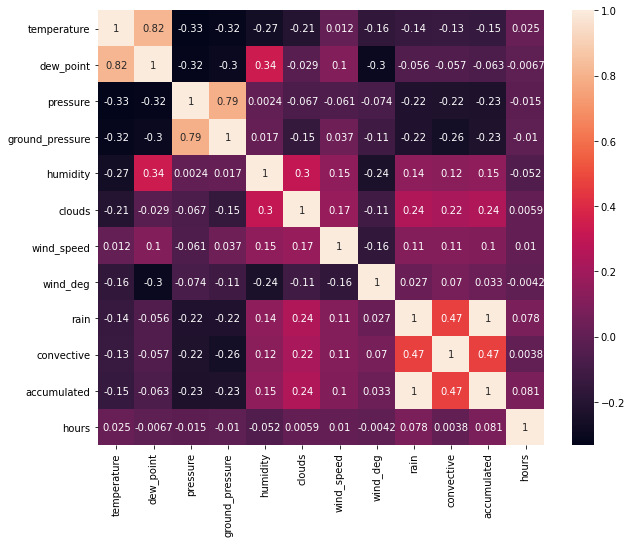

In [14]:
figure = plt.figure(figsize=(10,8))
sns.heatmap(df[features].corr(), annot =True) # There are strong correlation betwwen T dew point and pressure groudn pressure

- The features **rain <-> accumulated** are correlated in 0.9999 so we are going to drp accumulated. 
- **Temperature <-> dew points and pressure** <-> ground pressure  have a correlation of 0.8, by now we maintain them, just to take into consideration for next steps



In [15]:
df.drop(columns=['accumulated'])

,slice dt iso,lat,lon,temperature,dew_point,pressure,ground_pressure,humidity,clouds,wind_speed,wind_deg,rain,convective,hours,Direction N-S,Direction E-W,Compass,Tarifa_WindGust,Tarifa_Wind,Tarifa_WindDirection,Tarifa_Direction N-S,Tarifa_Direction E-W,Tarifa Compass
0,2019-02-16 09:00:00,36.013158,-5.598892,13.79,11.13,1021.601,1020.681,83.994,100.0,25.963871,95.202,0.125,0.125,3.0,-0.090667,0.995881,E,35.118709,17.624149,72.0,0.309017,0.951057,NEE
1,2019-02-16 12:00:00,36.013158,-5.598892,13.81,11.16,1022.066,1021.490,84.064,96.0,25.437090,93.856,0.375,0.375,6.0,-0.067249,0.997736,E,35.053915,21.835803,86.0,0.069756,0.997564,E
2,2019-02-16 15:00:00,36.013158,-5.598892,13.82,11.15,1020.887,1020.461,83.926,92.0,23.938390,93.883,0.188,0.188,3.0,-0.067719,0.997704,E,34.859531,20.539909,82.0,0.139173,0.990268,E
3,2019-02-16 18:00:00,36.013158,-5.598892,13.77,11.27,1020.964,1020.196,84.583,94.0,19.924360,95.812,0.312,0.312,6.0,-0.101265,0.994860,E,35.766656,23.326080,87.0,0.052336,0.998630,E
4,2019-02-16 21:00:00,36.013158,-5.598892,13.74,11.24,1022.636,1021.323,84.845,88.0,16.271885,94.213,0.000,0.000,3.0,-0.073464,0.997298,E,NaN,NaN,83.0,0.121869,0.992546,E
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6341,2021-05-19 09:00:00,36.013158,-5.598892,23.05,12.91,1018.467,1006.124,52.600,41.9,1.315980,231.962,0.000,0.000,3.0,-0.616184,-0.787602,SW,6.933029,3.239733,249.0,-0.358368,-0.933580,SWW
6342,2021-05-19 12:00:00,36.013158,-5.598892,24.45,11.55,1018.233,1005.913,44.200,28.7,4.089839,78.455,0.000,0.000,6.0,0.200138,0.979768,NEE,20.215936,12.829344,102.0,-0.207912,0.978148,SEE
6343,2021-05-19 15:00:00,36.013158,-5.598892,22.65,12.45,1018.215,1005.855,52.500,25.3,11.151810,68.753,0.000,0.000,3.0,0.362389,0.932027,NEE,28.768832,17.948123,74.0,0.275637,0.961262,NEE
6344,2021-05-19 18:00:00,36.013158,-5.598892,19.66,16.55,1018.845,1006.444,82.600,21.5,11.254834,61.292,0.000,0.000,6.0,0.480346,0.877079,NEE,27.861707,17.818533,72.0,0.309017,0.951057,NEE


In [16]:
df['hours'].value_counts() 


3.0    3176
6.0    2377
Name: hours, dtype: int64

'hour' column tells us for how long the rain is forecasted (1 perid of 3 h or 2 period of 3 hour). 
Because of we already have the rain forecasted per 3h period, this column will bring redundant information so we are going to drop it too.

In [17]:
df.drop(columns=['hours'], inplace=True)

In [18]:
df

,slice dt iso,lat,lon,temperature,dew_point,pressure,ground_pressure,humidity,clouds,wind_speed,wind_deg,rain,convective,accumulated,Direction N-S,Direction E-W,Compass,Tarifa_WindGust,Tarifa_Wind,Tarifa_WindDirection,Tarifa_Direction N-S,Tarifa_Direction E-W,Tarifa Compass
0,2019-02-16 09:00:00,36.013158,-5.598892,13.79,11.13,1021.601,1020.681,83.994,100.0,25.963871,95.202,0.125,0.125,0.125,-0.090667,0.995881,E,35.118709,17.624149,72.0,0.309017,0.951057,NEE
1,2019-02-16 12:00:00,36.013158,-5.598892,13.81,11.16,1022.066,1021.490,84.064,96.0,25.437090,93.856,0.375,0.375,0.375,-0.067249,0.997736,E,35.053915,21.835803,86.0,0.069756,0.997564,E
2,2019-02-16 15:00:00,36.013158,-5.598892,13.82,11.15,1020.887,1020.461,83.926,92.0,23.938390,93.883,0.188,0.188,0.188,-0.067719,0.997704,E,34.859531,20.539909,82.0,0.139173,0.990268,E
3,2019-02-16 18:00:00,36.013158,-5.598892,13.77,11.27,1020.964,1020.196,84.583,94.0,19.924360,95.812,0.312,0.312,0.312,-0.101265,0.994860,E,35.766656,23.326080,87.0,0.052336,0.998630,E
4,2019-02-16 21:00:00,36.013158,-5.598892,13.74,11.24,1022.636,1021.323,84.845,88.0,16.271885,94.213,0.000,0.000,0.000,-0.073464,0.997298,E,NaN,NaN,83.0,0.121869,0.992546,E
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6341,2021-05-19 09:00:00,36.013158,-5.598892,23.05,12.91,1018.467,1006.124,52.600,41.9,1.315980,231.962,0.000,0.000,0.000,-0.616184,-0.787602,SW,6.933029,3.239733,249.0,-0.358368,-0.933580,SWW
6342,2021-05-19 12:00:00,36.013158,-5.598892,24.45,11.55,1018.233,1005.913,44.200,28.7,4.089839,78.455,0.000,0.000,0.000,0.200138,0.979768,NEE,20.215936,12.829344,102.0,-0.207912,0.978148,SEE
6343,2021-05-19 15:00:00,36.013158,-5.598892,22.65,12.45,1018.215,1005.855,52.500,25.3,11.151810,68.753,0.000,0.000,0.000,0.362389,0.932027,NEE,28.768832,17.948123,74.0,0.275637,0.961262,NEE
6344,2021-05-19 18:00:00,36.013158,-5.598892,19.66,16.55,1018.845,1006.444,82.600,21.5,11.254834,61.292,0.000,0.000,0.000,0.480346,0.877079,NEE,27.861707,17.818533,72.0,0.309017,0.951057,NEE


In [19]:
df.columns

Index(['slice dt iso', 'lat', 'lon', 'temperature', 'dew_point', 'pressure',
       'ground_pressure', 'humidity', 'clouds', 'wind_speed', 'wind_deg',
       'rain', 'convective', 'accumulated', 'Direction N-S', 'Direction E-W',
       'Compass', 'Tarifa_WindGust', 'Tarifa_Wind', 'Tarifa_WindDirection',
       'Tarifa_Direction N-S', 'Tarifa_Direction E-W', 'Tarifa Compass'],
      dtype='object')

In [20]:
features = ['temperature', 'dew_point', 'pressure',
       'ground_pressure', 'humidity', 'clouds', 'wind_speed', 'wind_deg',
       'rain', 'convective', 'Compass']
targets = ['Tarifa_Wind','Tarifa_WindGust','Tarifa_WindDirection', 'Tarifa Compass']

In [21]:
df.corr()

,lat,lon,temperature,dew_point,pressure,ground_pressure,humidity,clouds,wind_speed,wind_deg,rain,convective,accumulated,Direction N-S,Direction E-W,Tarifa_WindGust,Tarifa_Wind,Tarifa_WindDirection,Tarifa_Direction N-S,Tarifa_Direction E-W
lat,1.000000e+00,1.000000e+00,3.471438e-15,5.639647e-15,5.496779e-13,-2.169057e-13,-1.868875e-14,6.168948e-15,7.836943e-16,-6.317050e-15,5.988837e-15,9.241047e-15,8.284363e-15,-8.154862e-17,-1.018520e-16,7.913791e-15,-1.789840e-15,3.046074e-15,-8.083134e-16,-7.972672e-17
lon,1.000000e+00,1.000000e+00,3.725083e-15,4.794987e-15,5.498291e-13,-2.172299e-13,-1.876031e-14,-1.489557e-15,6.144057e-16,-6.213633e-15,1.914757e-15,-5.037686e-15,-5.617832e-15,-1.166096e-16,-2.718290e-16,7.716219e-15,-1.725565e-15,-8.282629e-16,-1.460011e-15,6.956702e-17
temperature,3.471438e-15,3.725083e-15,1.000000e+00,8.153976e-01,-3.334423e-01,-3.167623e-01,-2.662556e-01,-2.082180e-01,1.185243e-02,-1.565360e-01,-1.374086e-01,-1.317918e-01,-1.454240e-01,-8.536093e-03,1.147566e-01,1.242829e-01,1.380690e-01,-7.032932e-02,-1.264280e-01,2.979056e-02
dew_point,5.639647e-15,4.794987e-15,8.153976e-01,1.000000e+00,-3.230060e-01,-2.952761e-01,3.366443e-01,-2.881142e-02,1.044316e-01,-2.979798e-01,-5.601570e-02,-5.685488e-02,-6.324893e-02,6.167091e-02,2.550851e-01,2.337848e-01,2.413697e-01,-2.079930e-01,-6.293711e-02,1.911257e-01
pressure,5.496779e-13,5.498291e-13,-3.334423e-01,-3.230060e-01,1.000000e+00,7.936754e-01,2.386586e-03,-6.736015e-02,-6.140143e-02,-7.392637e-02,-2.219607e-01,-2.246997e-01,-2.320015e-01,1.124376e-01,8.770724e-02,-3.631183e-02,-9.532720e-03,-7.640292e-02,1.278843e-01,9.800411e-02
ground_pressure,-2.169057e-13,-2.172299e-13,-3.167623e-01,-2.952761e-01,7.936754e-01,1.000000e+00,1.725127e-02,-1.500865e-01,3.713717e-02,-1.139743e-01,-2.200761e-01,-2.613321e-01,-2.283528e-01,5.921728e-02,1.356384e-01,9.093893e-02,1.152205e-01,-1.235499e-01,9.141963e-02,1.450548e-01
humidity,-1.868875e-14,-1.876031e-14,-2.662556e-01,3.366443e-01,2.386586e-03,1.725127e-02,1.000000e+00,3.044920e-01,1.471749e-01,-2.385065e-01,1.431418e-01,1.249643e-01,1.460447e-01,1.052648e-01,2.333794e-01,1.796070e-01,1.682642e-01,-2.268792e-01,9.157677e-02,2.623702e-01
clouds,6.168948e-15,-1.489557e-15,-2.082180e-01,-2.881142e-02,-6.736015e-02,-1.500865e-01,3.044920e-01,1.000000e+00,1.684820e-01,-1.064435e-01,2.406661e-01,2.196654e-01,2.427370e-01,-3.660134e-02,1.229480e-01,1.644678e-01,1.409141e-01,-1.222845e-01,-1.113091e-01,1.189175e-01
wind_speed,7.836943e-16,6.144057e-16,1.185243e-02,1.044316e-01,-6.140143e-02,3.713717e-02,1.471749e-01,1.684820e-01,1.000000e+00,-1.591491e-01,1.111011e-01,1.105342e-01,9.987137e-02,-5.564176e-02,1.978737e-01,8.221981e-01,7.925521e-01,-1.603299e-01,-1.437078e-01,1.724781e-01
wind_deg,-6.317050e-15,-6.213633e-15,-1.565360e-01,-2.979798e-01,-7.392637e-02,-1.139743e-01,-2.385065e-01,-1.064435e-01,-1.591491e-01,1.000000e+00,2.697926e-02,7.032816e-02,3.348156e-02,-4.665301e-01,-9.732893e-01,-4.794213e-01,-5.039230e-01,8.234000e-01,-9.302796e-02,-8.740256e-01


<AxesSubplot:>

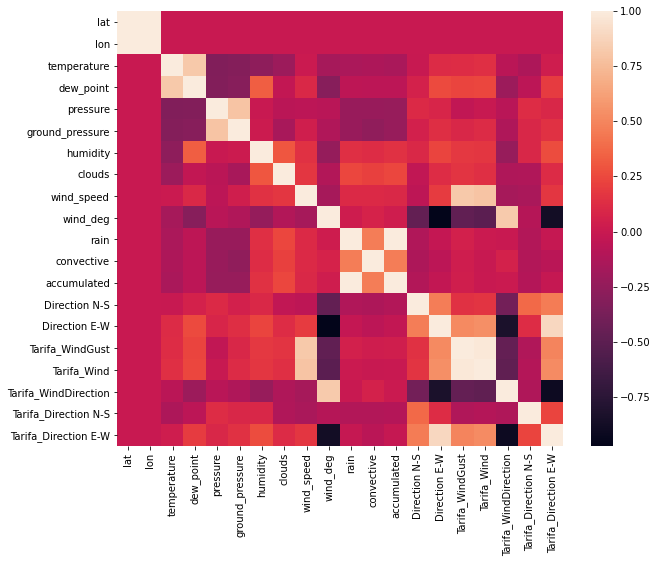

In [22]:
figure = plt.figure(figsize=(10,8))
sns.heatmap(df.corr()) 

# Just one last look of the correlations--> Nothing unexpected, the wind and direcitons variables
# of feagtures and targets should have a but of correlation and lat lon are just static parameters.

In [23]:
df.isna().sum() # we still have this na to be treated!

slice dt iso              0
lat                       0
lon                       0
temperature               0
dew_point                 0
pressure                  0
ground_pressure           0
humidity                  0
clouds                  793
wind_speed                0
wind_deg                  0
rain                    120
convective              793
accumulated             793
Direction N-S             0
Direction E-W             0
Compass                   0
Tarifa_WindGust          29
Tarifa_Wind              19
Tarifa_WindDirection     17
Tarifa_Direction N-S     17
Tarifa_Direction E-W     17
Tarifa Compass            0
dtype: int64

In [24]:
# last but not least we re going to convert to datetime data the column 'slice dt iso'
df['slice dt iso'] = pd.to_datetime(df['slice dt iso'])

In [25]:
df.dtypes

slice dt iso            datetime64[ns]
lat                            float64
lon                            float64
temperature                    float64
dew_point                      float64
pressure                       float64
ground_pressure                float64
humidity                       float64
clouds                         float64
wind_speed                     float64
wind_deg                       float64
rain                           float64
convective                     float64
accumulated                    float64
Direction N-S                  float64
Direction E-W                  float64
Compass                         object
Tarifa_WindGust                float64
Tarifa_Wind                    float64
Tarifa_WindDirection           float64
Tarifa_Direction N-S           float64
Tarifa_Direction E-W           float64
Tarifa Compass                  object
dtype: object

## 2 Data distribution and graphics

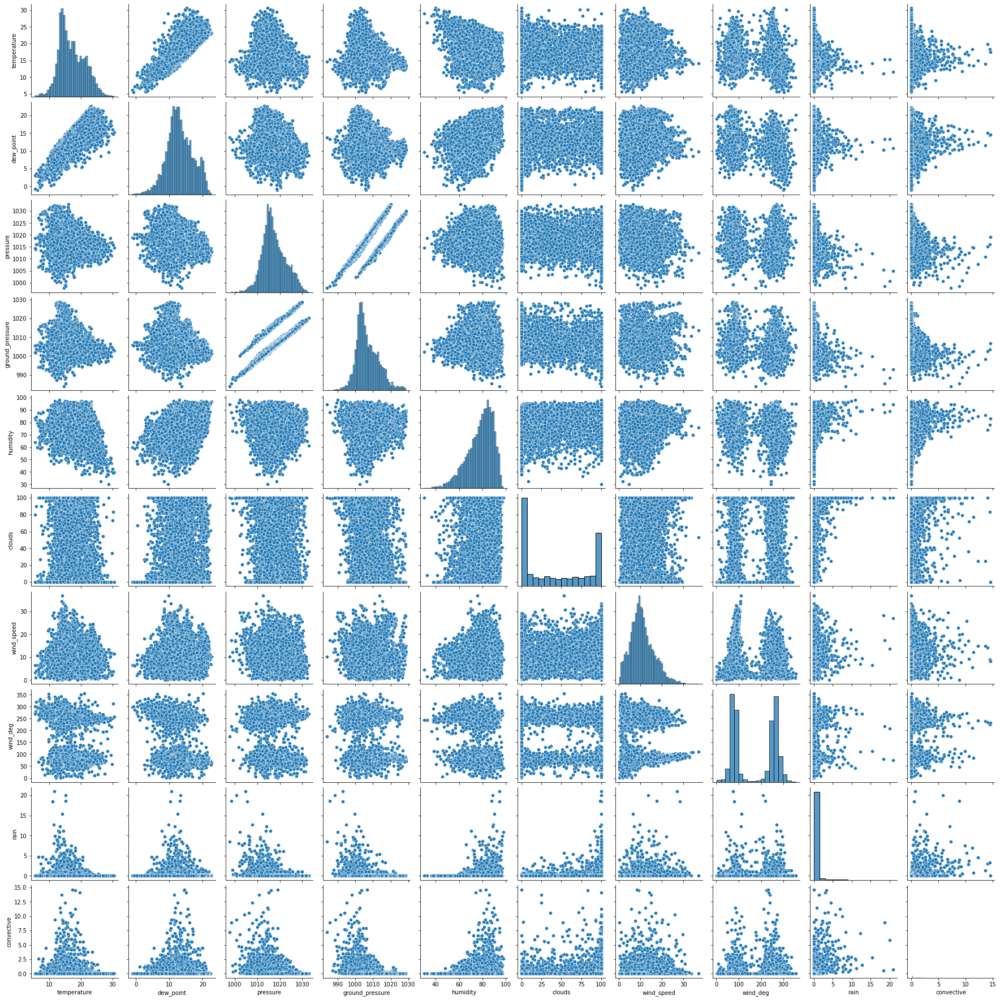

In [26]:
sns.pairplot(df[features]);

In this prelimiary pairplot the main insights that we can collect are:
- Wind direction has a clear clustering around E(90º) and W (180º) what is not so surprising as Tarifa is located at stait of gibraltar and due to its particualr geogrphy is famouse for this two main wind directions so called "poniente"(W) and "levante" (E), what surely is going to be an decisive factor in this project. 
- Clouds might be also an important climatic factor beacause there is a clear clustering characher in the 0% and 100% clouds coverage. 
- We can see the some correlations character between temperature <-> dew point but for now we maintain the two variables. 

- **Regarding pressure and ground pressure we can see a weird behaviour is like linear perfect correlated but in two different lines, let s have a closer look because might be caused by a change in the forecasting model.**


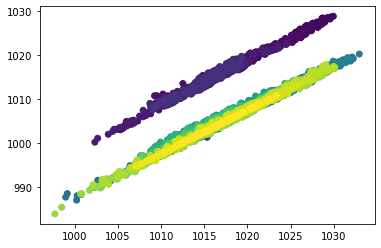

In [27]:
plt.scatter(x = df['pressure'], y= df['ground_pressure'], c=df['slice dt iso']); 

..mmm it seems that there was a time moment were there was that abrupt change.  let s find the exact spot..

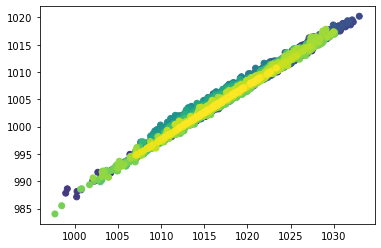

In [28]:
df1 = df[df['slice dt iso']>'2019-09']
plt.scatter(x = df1['pressure'], y= df1['ground_pressure'], c=df1['slice dt iso']);

Definitevely this two variable are perfectly correlated, just there was a change in the criteria about sep.2019. 
Then we can drop one of them (ground pressure) for avoidiing perfect correlated variables between featurres that dont add value in our ML project.

In [29]:
df.drop(columns ='ground_pressure', inplace=True)

Let s have a look now in the target variables..

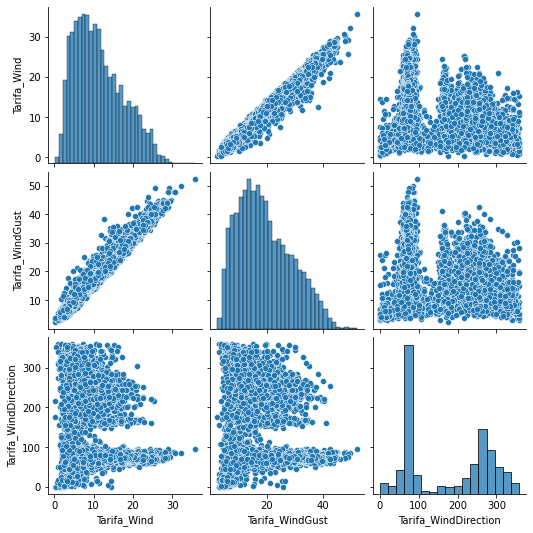

In [30]:
sns.pairplot(df[targets])

Having a look on the target we can see a linear between the wind and the wind gust. Anyhow this varialbe will be important later because the difference between the gust and the mean wind will tell us about the wind quiality. 

The E and W predominant wind directions are also clear, but there the variance in direction with E Wind (levante) looks smaler than with W wind, that can vary much more often from SW to NW. 

/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


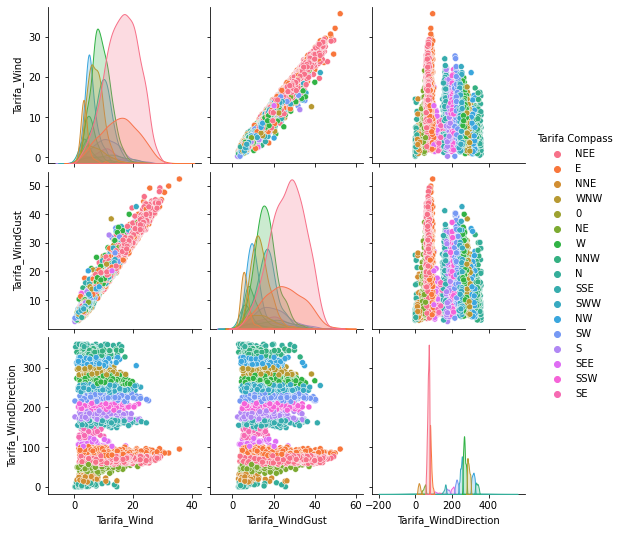

In [31]:
sns.pairplot(df[targets], hue='Tarifa Compass')

Here we can see that E winds tend to blow much stronger than west winds 

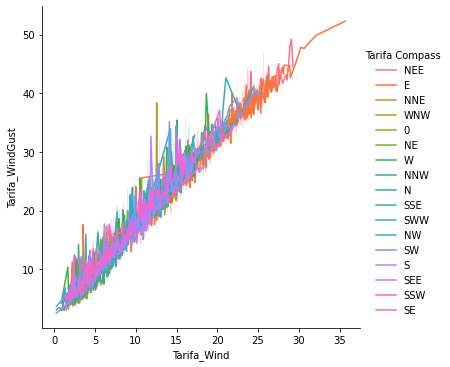

In [32]:
sns.relplot(data=df,x='Tarifa_Wind', y='Tarifa_WindGust',kind='line', hue='Tarifa Compass')

Here we can see that there is a linear correlation between average wind and gust, but it s not very clear yet if the slope is different depending on the direction, lets have a look just in the east and close directions...

<Figure size 720x576 with 0 Axes>

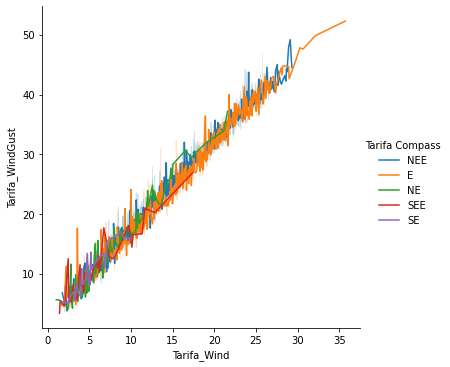

In [33]:
figure = plt.figure(figsize=(10,8))

sns.relplot(data=df[df['Tarifa Compass'].isin(['NE','NEE','E','SEE','SE'])],x='Tarifa_Wind', y='Tarifa_WindGust',kind='line', hue='Tarifa Compass')



Well still not a very clear differnce in the slope depending on the direction of the wind. That s disappointing because the domain knowledge tell us that when the wind comes form NEE or NE is more gusty than when is coming from SEE SE but that s not appreciated in our data. **The reason might be that we are just having wind max during a period of time (1h) as vmax, but we are not detailing the duration of the gust or the frecuecy of them what car really tell us the gusty characher of the wind. The conclusion is that vmax is not gonna be useful to evaluate the quality of the wind, because our data does not really appreciate that different in the windgust varable.** 


## 3 Relation between features (forecast) and actuals mesurements

Let s have a look in the accuracy of the predictions and the effect on features varaibles in the deviation of the actuals vs the forecasted wind.

For that purpose the strategy would be to create a new variable with the error measured between the forecast and the weather station data. DELTA Wind. 

Also for the direction is intereting to meassure the delta angle. We have a problem with 359ª is N wind, and 1ª is N Wind, for that purpose we would use the N/S WE components. 

**Disclaimer.** We re going to find an bias error that could come from the accuracy from the weather station, that we have to see how are going treat it, but what we want to find is it there is any factor that affect the general deviation, what then can be consider as a pure forecast error, non attribuible to bias error. 

In [34]:
df['delta_Wind'] = df['Tarifa_Wind']-df['wind_speed']
df['delta_N-S'] = df['Tarifa_Direction N-S'] - df['Direction N-S'] 
df['delta_E-W'] = df['Tarifa_Direction E-W'] - df['Direction E-W']

In [35]:
newtarget = ['delta_Wind','delta_N-S','delta_E-W']
features = ['temperature', 'dew_point', 'pressure', 'humidity', 'clouds', 'wind_speed', 'wind_deg','rain', 'convective', 'Compass']

In [36]:
df[newtarget].shape

(6346, 3)

In [37]:
df[features].shape

(6346, 10)

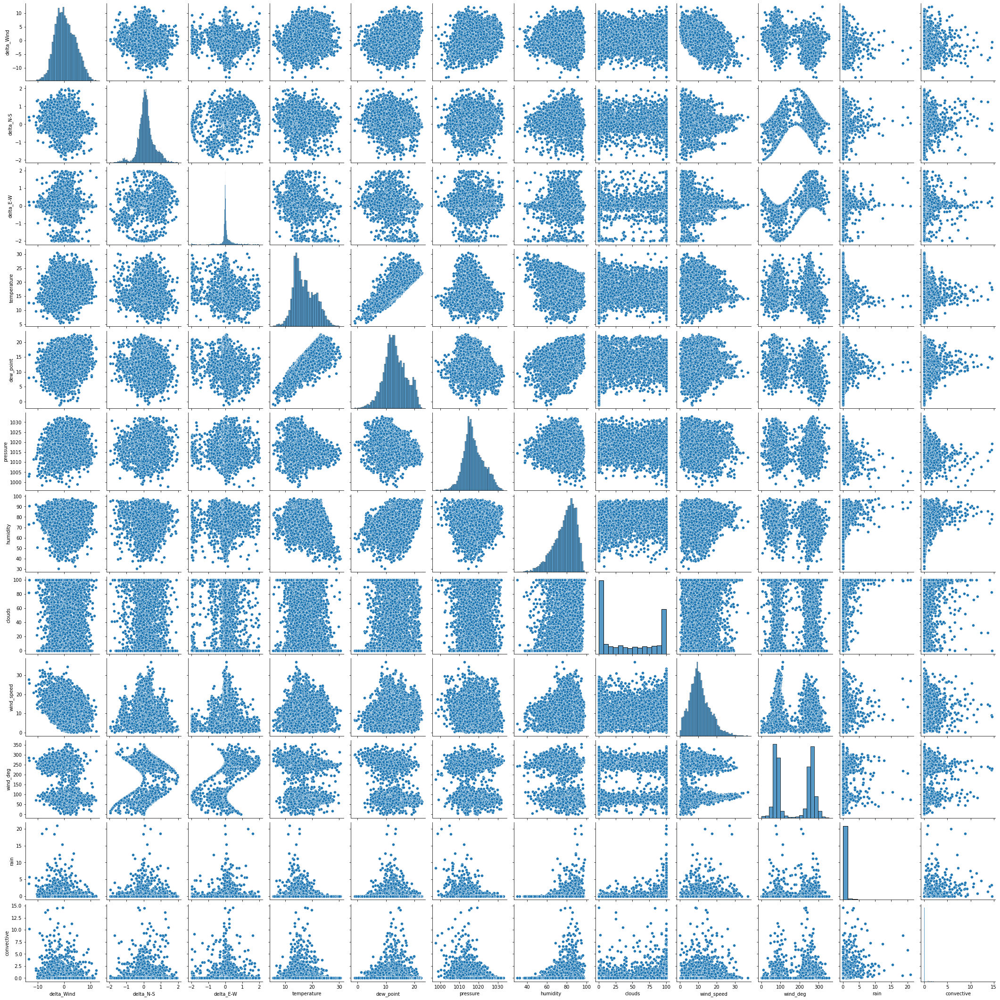

In [38]:
sns.pairplot(pd.concat([df[newtarget],df[features]],axis =1))

let s see in detail just in the significant.

<AxesSubplot:xlabel='delta_Wind', ylabel='Count'>

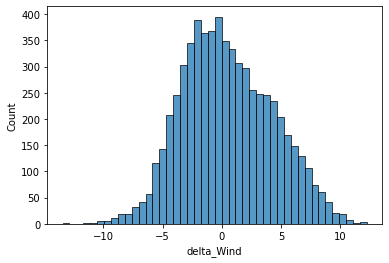

In [39]:
sns.histplot(df['delta_Wind']) 

<AxesSubplot:xlabel='delta_Wind'>

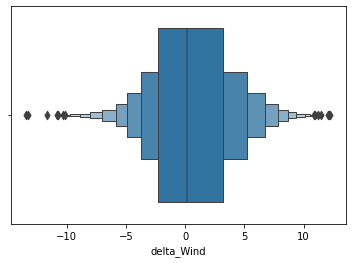

In [40]:
sns.boxenplot(x= df['delta_Wind']) # We can say that the average deviation is pretty centered.

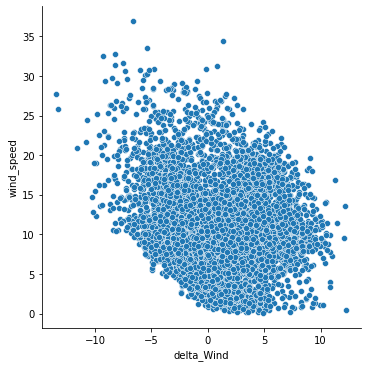

In [41]:
sns.relplot(y = df['wind_speed'], x = df['delta_Wind']) # Here we can see inverse linear relation

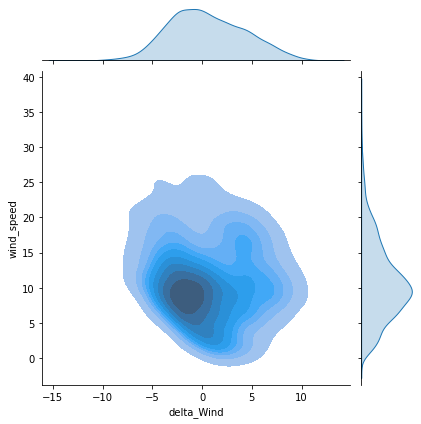

In [48]:
sns.jointplot(y = df['wind_speed'], x = df['delta_Wind'], kind='kde', fill='True')

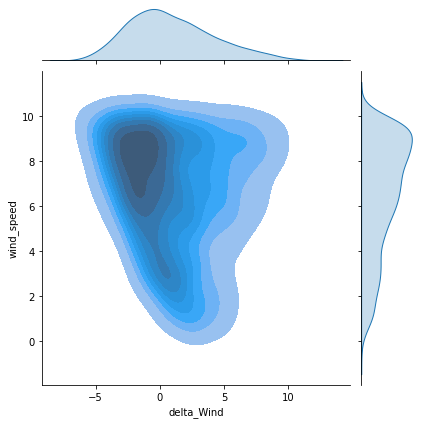

In [55]:
df1=df[df['wind_speed']<10]
sns.jointplot(y = df1['wind_speed'], x = df1['delta_Wind'], kind='kde', fill='True')

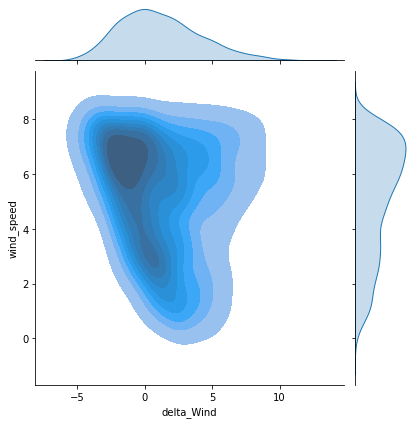

In [56]:
df1=df[df['wind_speed']<8 ]
sns.jointplot(y = df1['wind_speed'], x = df1['delta_Wind'], kind='kde', fill='True')

We could say that ever though there is a slight bias to underestimate the wind , when the wind is light the variance in the underestimation of the wind is important, that means there are many days that the forecast sais less wind than what finally ocurr. 

But still not very clear trends... let s try to see if there are factors in the features that tell us something about wind deviation..


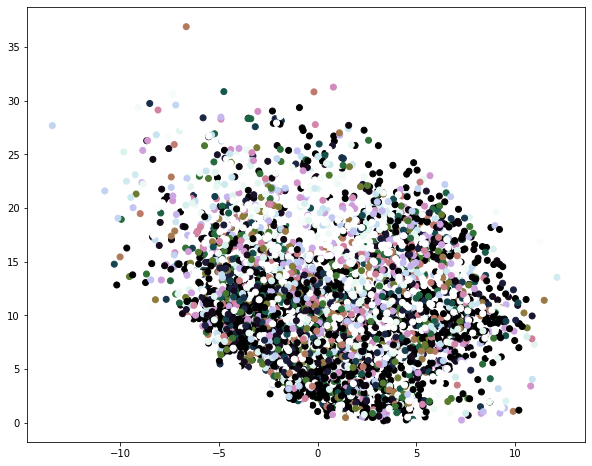

In [65]:
figure = plt.figure(figsize=(10,8))
plt.scatter(x=df['delta_Wind'], y=df['wind_speed'], c=df['clouds'], cmap='cubehelix')

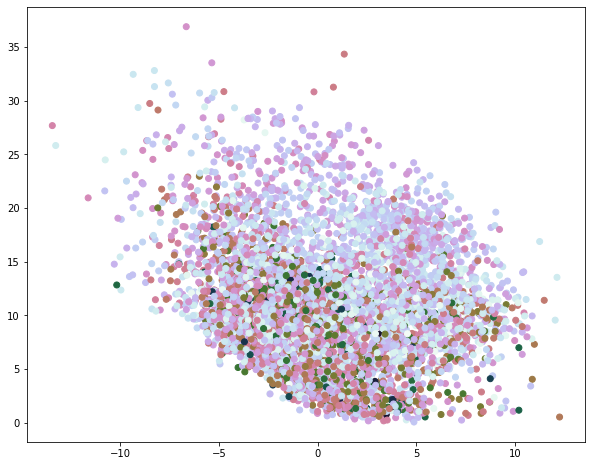

In [66]:
figure = plt.figure(figsize=(10,8))
plt.scatter(x=df['delta_Wind'], y=df['wind_speed'], c=df['humidity'], cmap='cubehelix')

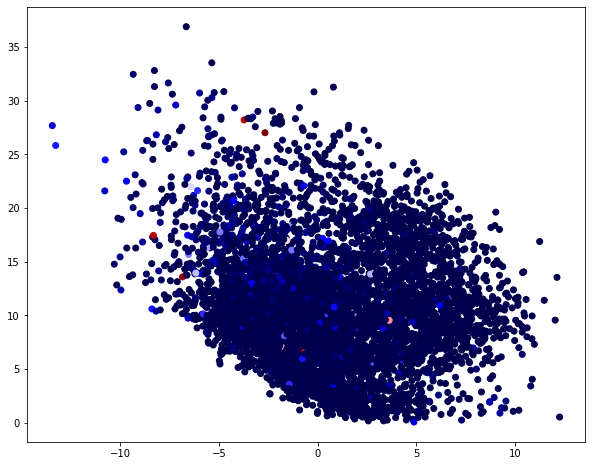

In [73]:
figure = plt.figure(figsize=(10,8))
plt.scatter(x=df['delta_Wind'], y=df['wind_speed'], c=df['rain'], cmap='seismic')

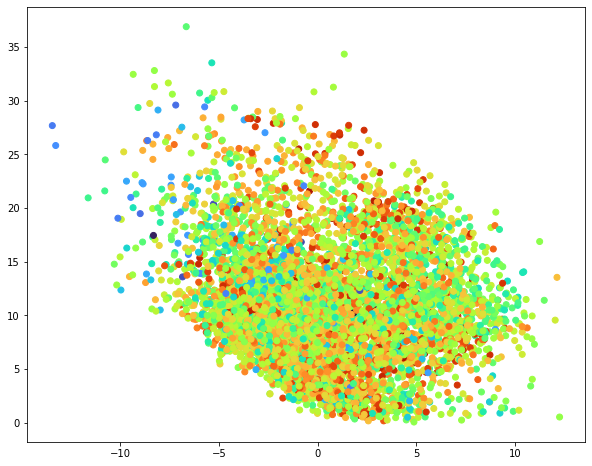

In [68]:
figure = plt.figure(figsize=(10,8))
plt.scatter(x=df['delta_Wind'], y=df['wind_speed'], c=df['pressure'], cmap='turbo')

In [ ]:
figure = plt.figure(figsize=(10,8))
df1=df[df['temperature]
plt.scatter(x=df['delta_Wind'], y=df['wind_speed'], c=df['temperature'], cmap='turbo')

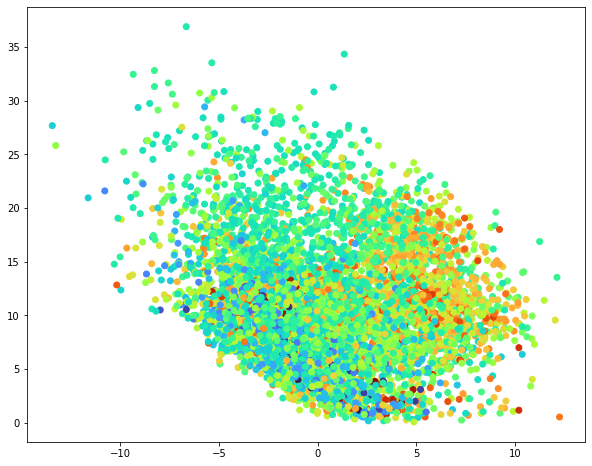

In [63]:
figure = plt.figure(figsize=(10,8))
plt.scatter(x=df['delta_Wind'], y=df['wind_speed'], c=df['temperature'], cmap='turbo');

***et voila! We can appreciate that temperature is a factor can have a significant positive bias in the actual wind vs the forecasted wind.*** 

<Figure size 720x576 with 0 Axes>

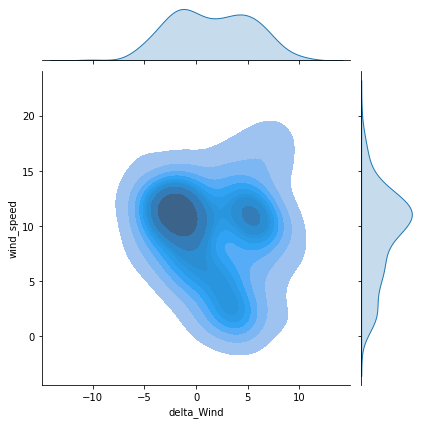

In [80]:
df1 = df[df['temperature']>25]
figure = plt.figure(figsize=(10,8))
sns.jointplot(y = df1['wind_speed'], x = df1['delta_Wind'], kind='kde', fill='True');


Mm it seems when we filter for time slots where the temperature was grater than 25ª there a new cluster appear in the +5 knots area. Well let 

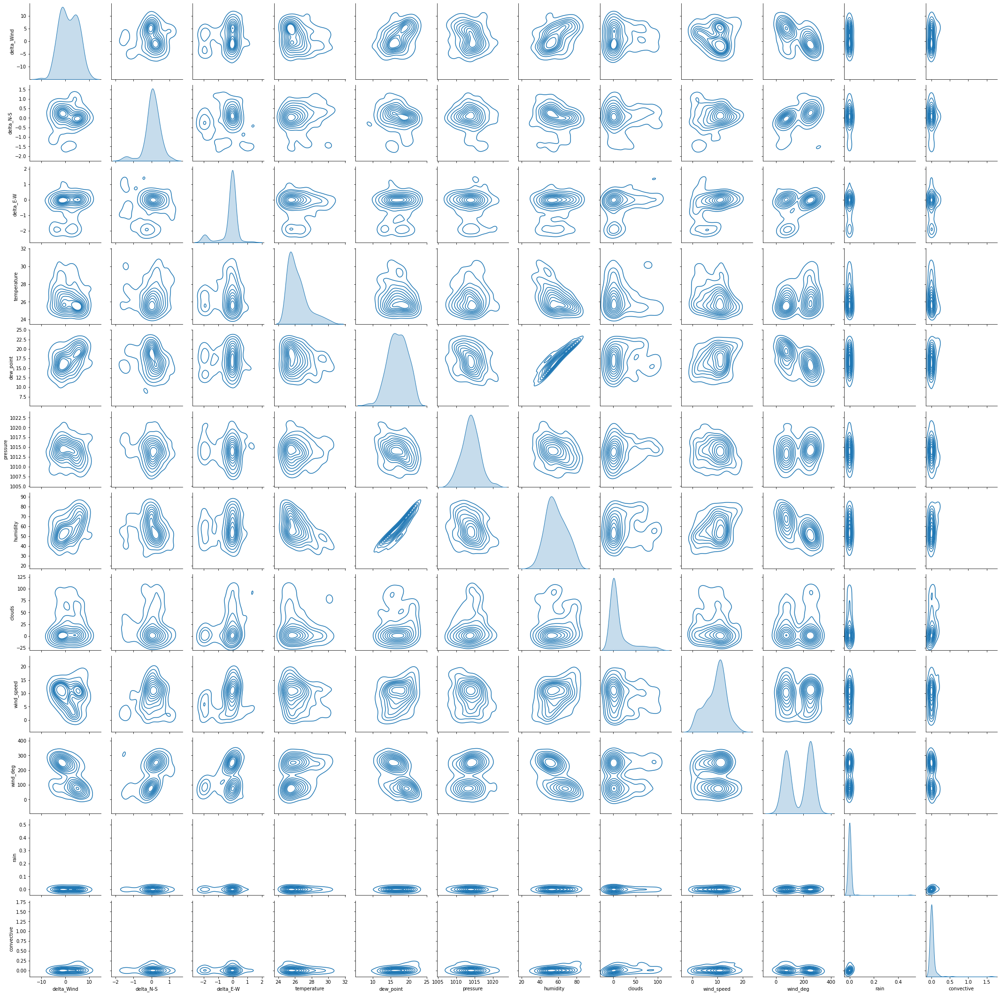

In [91]:
sns.pairplot(pd.concat([df1[newtarget],df1[features]],axis =1), kind = 'kde')

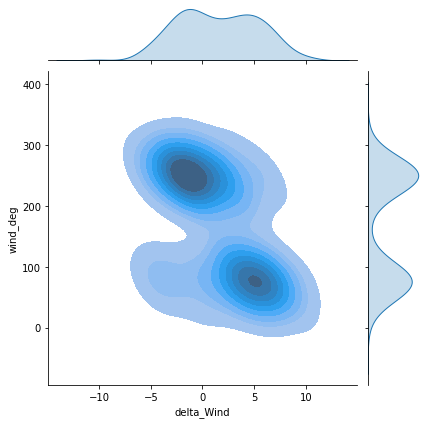

In [92]:
df1 = df[df['temperature']>25]
sns.jointplot(y = df1['wind_deg'], x = df1['delta_Wind'], kind='kde', fill='True');

mmm... so we have an interesting insight, when the wind is coming from the E and the temperature greater than 25º, we can expect an average +5 knots than forecasted. **But let stop doing basic analyics insights and let s help the machine help us!**